In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
import cv2
import glob

# Camera Calibration  
---
### Undistorte the images

Can NOT find Corners in calibration5.jpg
Can NOT find Corners in calibration4.jpg
Can NOT find Corners in calibration1.jpg


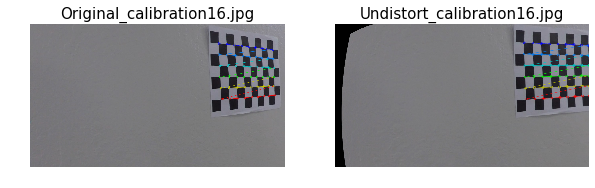

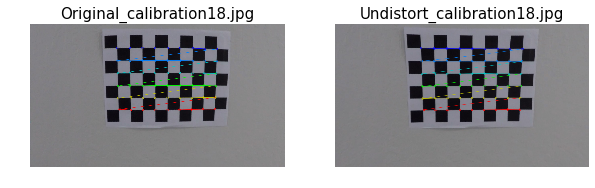

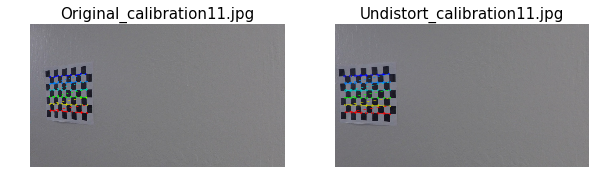

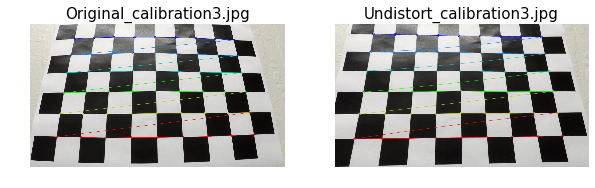

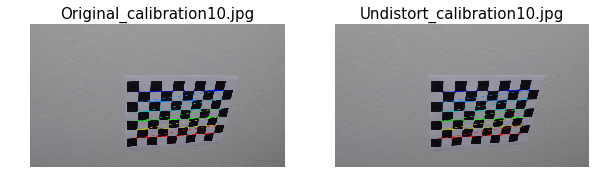

...

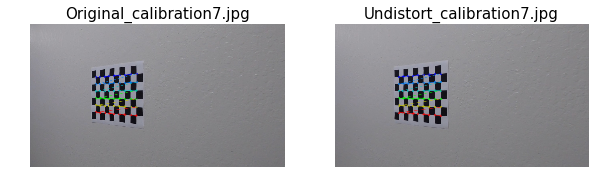

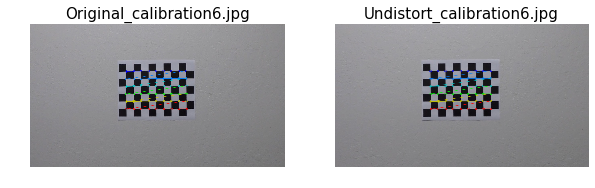

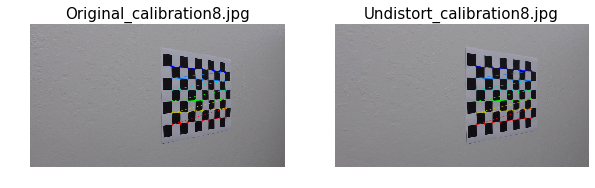

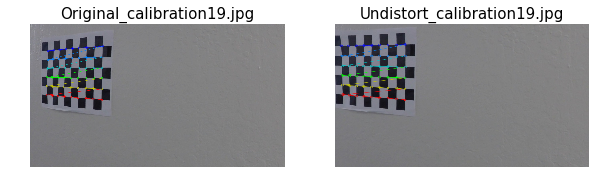

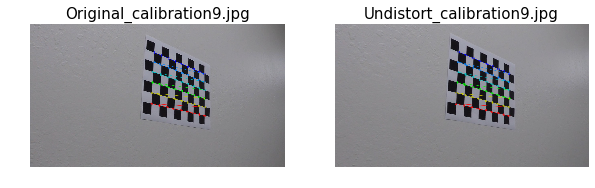

In [2]:
fnames = glob.glob('./camera_cal/calibration*.jpg')
undist_images = {}
objpoints = []
imgpoints = []

nx = 9
ny = 6
objp = np.zeros((ny*nx, 3), np.float32)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)

for fname in fnames: 
    img = mpimg.imread(fname)

    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)

        img_draw = cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        
        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
        dst = cv2.undistort(img_draw, mtx, dist, None, mtx)
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
        ax1.imshow(img)
        ax1.axis('off')
        ax1.set_title('Original_'+fname.split('/')[-1], fontsize=15)
        ax2.imshow(dst)
        ax2.axis('off')
        ax2.set_title('Undistort_'+fname.split('/')[-1], fontsize=15)
    else:
        print("Can NOT find Corners in {}".format(fname.split('/')[-1]))

In [3]:
def camera_calibration(fname, nx, ny):
    '''
    
    :param fname: the path of the distort image
    :param nx: number of points in row
    :param ny: number of points in column
    :return: undistort image
    '''
    objpoints = []
    imgpoints = []
    
    objp = np.zeros((ny*nx, 3), np.float32)
    objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)
    
    img = mpimg.imread(fname)

    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)

        img = cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        
        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
        dst = cv2.undistort(img, mtx, dist, None, mtx)
        return dst
    else:
        print("Can NOT find Corners in {}".format(fname.split('/')[-1]))
        return None


/home/leo/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/ipykernel/__main__.py:6: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.


Can NOT find Corners in calibration5.jpg
Can NOT find Corners in calibration4.jpg
Can NOT find Corners in calibration1.jpg


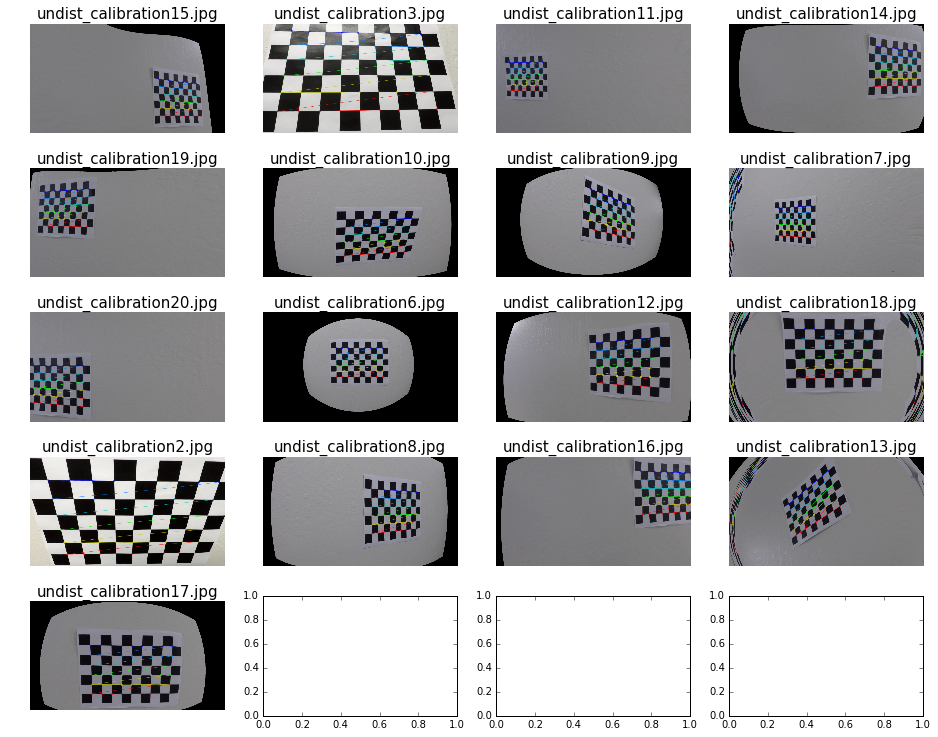

In [4]:
fnames = glob.glob('./camera_cal/calibration*.jpg')
undist_images = {}

for fname in fnames:    
    undistort = camera_calibration(fname, 9, 6)
    if undistort != None:
        undist_images[fname] = undistort

ncol = 4
nrow = int(np.ceil(len(undist_images)/ncol))
fig, axes = plt.subplots(nrow, ncol, figsize=(ncol*4, nrow*2.5))
axes = axes.ravel()
for fname, ax in zip(undist_images, axes):
    image = undist_images[fname]
    ax.axis('off')
    ax.imshow(image)
    ax.set_title('undist_'+fname.split('/')[-1], fontsize=15)
    

### 2. Perspective transform

In [5]:
def camera_undist_warped(fname, nx, ny):
    '''
    
    :param fname: the path of the distort image
    :param nx: number of points in row
    :param ny: number of points in column
    :return: undistort image
    '''
    objpoints = []
    imgpoints = []
    
    objp = np.zeros((ny*nx, 3), np.float32)
    objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)
    
    img = mpimg.imread(fname)

    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)

        img = cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        
        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
        undist = cv2.undistort(img, mtx, dist, None, mtx)
        
        src = np.float32([corners[0], corners[nx-1], corners[-1], corners[-nx]])
        offset = 250
        dst = np.float32([[offset,offset],[gray.shape[1]-offset,offset],
                          [gray.shape[1]-offset,gray.shape[0]-offset],[offset,gray.shape[0]-offset]])
        
        M = cv2.getPerspectiveTransform(src, dst)
        warped = cv2.warpPerspective(undist, M, gray.shape[::-1])
        
        return warped
    else:
        print("Can NOT find Corners in {}".format(fname.split('/')[-1]))
        return None


/home/leo/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/ipykernel/__main__.py:6: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.


Can NOT find Corners in calibration5.jpg
Can NOT find Corners in calibration4.jpg
Can NOT find Corners in calibration1.jpg


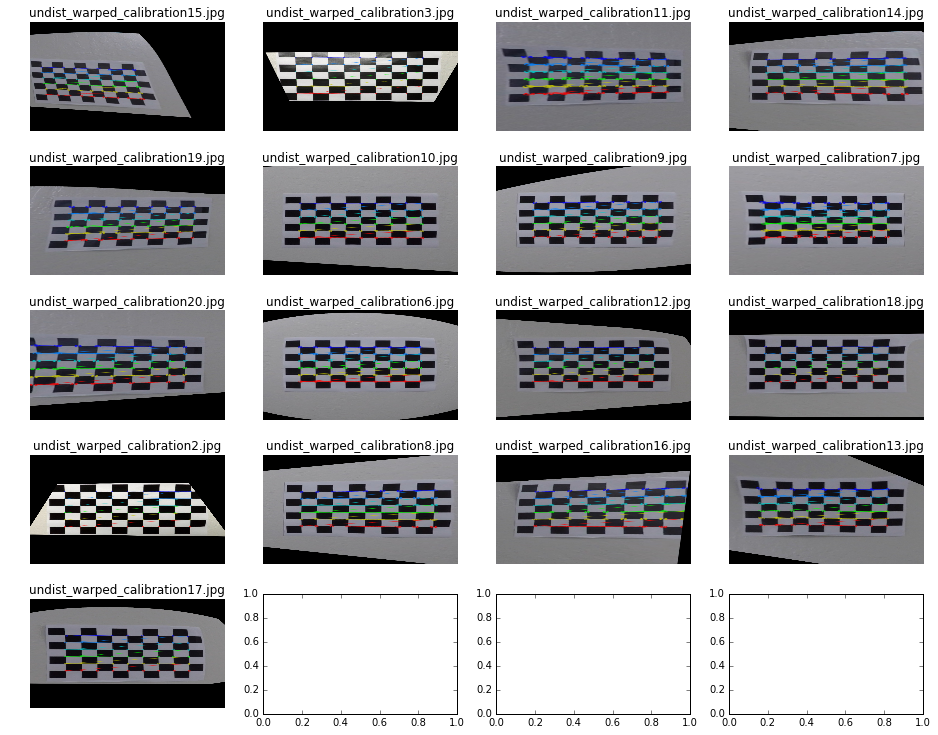

In [6]:
fnames = glob.glob('./camera_cal/calibration*.jpg')
undist_warped_images = {}

for fname in fnames:    
    undist_warped = camera_undist_warped(fname, 9, 6)
    if undist_warped != None:
        undist_warped_images[fname] = undist_warped

ncol = 4
nrow = int(np.ceil(len(undist_warped_images)/ncol))
fig, axes = plt.subplots(nrow, ncol, figsize=(ncol*4, nrow*2.5))
axes = axes.ravel()
for fname, ax in zip(undist_warped_images, axes):
    image = undist_warped_images[fname]
    ax.axis('off')
    ax.imshow(image)
    ax.set_title('undist_warped_'+fname.split('/')[-1])

# Pipeline (single images)
---
### 1. Provide an example of a distortion-corrected image.

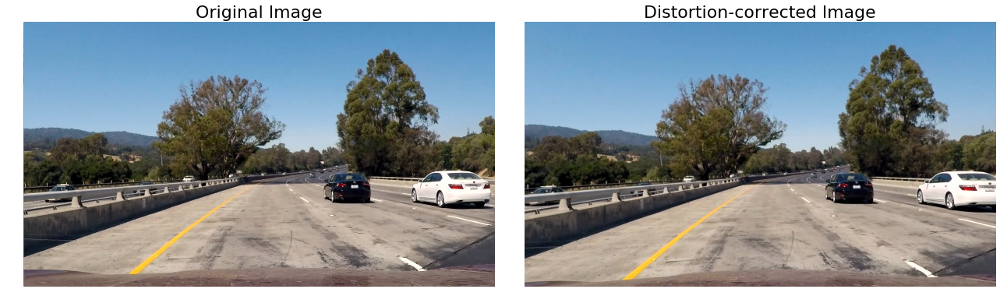

In [7]:
img_test = mpimg.imread('./test_images/test1.jpg')

img_size = (img_test.shape[1], img_test.shape[0])
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
undist = cv2.undistort(img_test, mtx, dist, None, mtx)

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(18,8))
fig.tight_layout()
ax1.imshow(img_test)
ax1.axis('off')
ax1.set_title('Original Image', fontsize=22)
ax2.imshow(undist)
ax2.axis('off')
ax2.set_title('Distortion-corrected Image', fontsize=22)

In [8]:
def undist_image(image):
    img_size = (image.shape[1], image.shape[0])
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    undist = cv2.undistort(image, mtx, dist, None, mtx)
    return undist

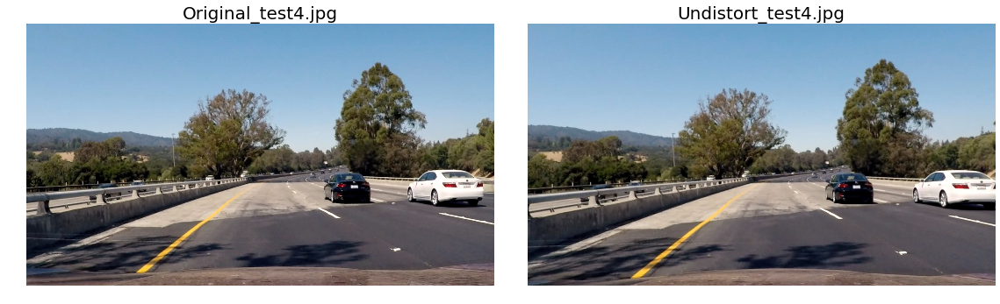

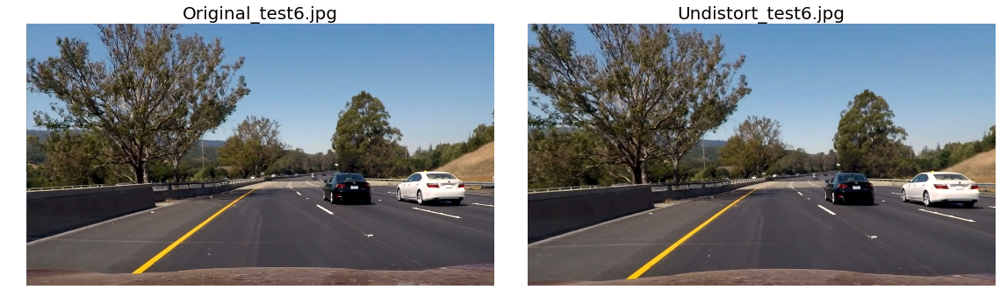

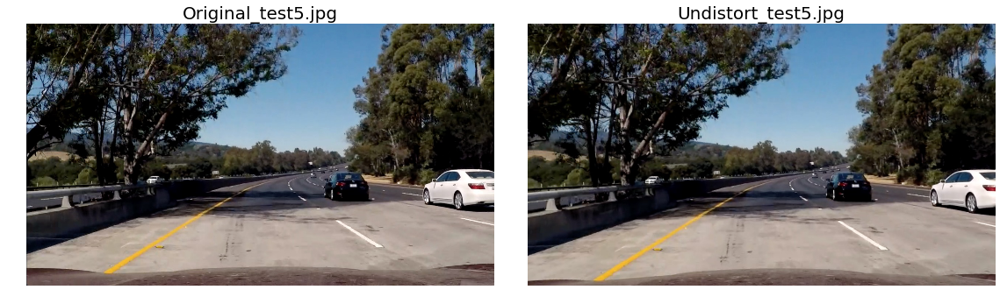

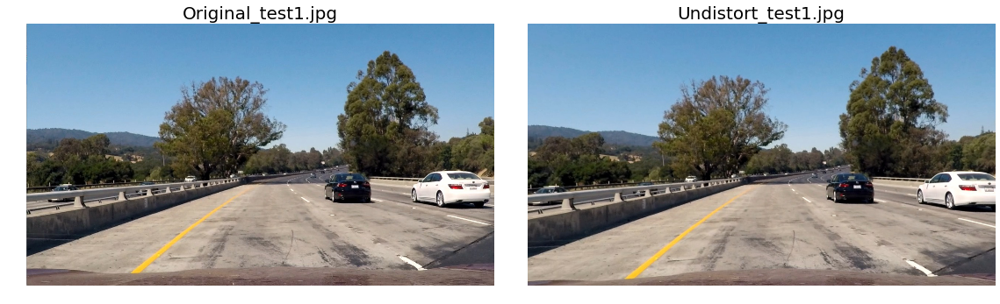

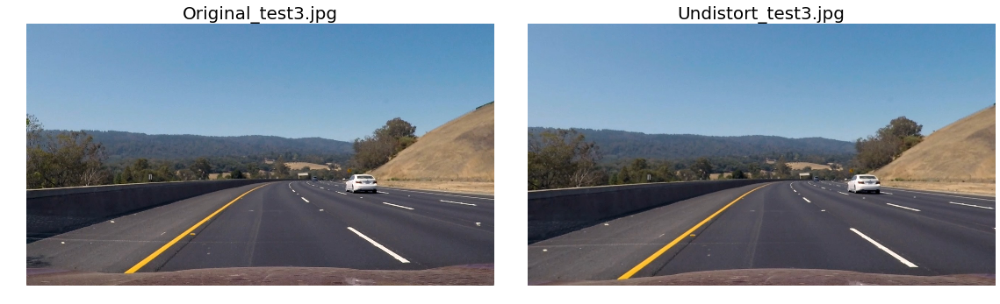

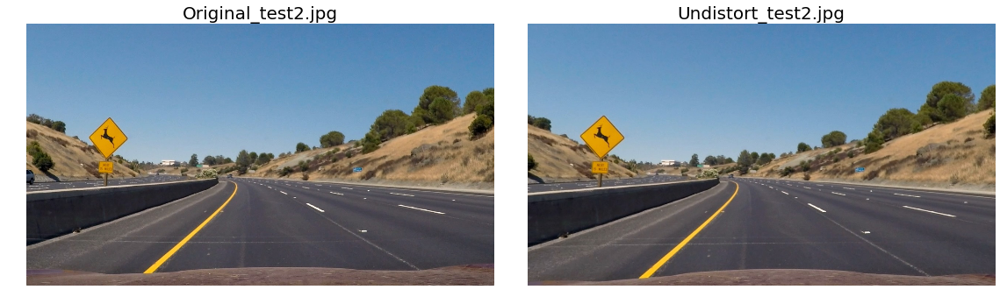

In [9]:
img_names = glob.glob('./test_images/test*.jpg')
for fname in img_names:
    img_test = mpimg.imread(fname)
    undist = undist_image(img_test)

    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(16,7))
    fig.tight_layout()
    ax1.imshow(img_test)
    ax1.axis('off')
    ax1.set_title('Original_'+fname.split('/')[-1], fontsize=20)
    ax2.imshow(undist)
    ax2.axis('off')
    ax2.set_title('Undistort_'+fname.split('/')[-1], fontsize=20)

### 2. Describe how (and identify where in your code) you used color transforms, gradients or other methods to create a thresholded binary image.  Provide an example of a binary image result.

In [10]:
def binary_thresh(image):
    
    lab = cv2.cvtColor(image, cv2.COLOR_RGB2Lab)
    l_channel = lab[:,:,0]
    b_channel = lab[:,:,2]
    
    # Pickup the yellow lines
    b_binary = np.zeros_like(b_channel)
    b_binary[(b_channel >= 155) & (b_channel <= 200)] = 1

    # Pickup the white lines
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= 225) & (l_channel <= 255)] = 1
    
    # S channel can pick up the yellow lines and white
    #s_channel = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)[:,:,2]
    #s_binary = np.zeros_like(s_channel)
    #s_binary[(s_channel >= 120) & (s_channel <= 250)] = 1
    
    #s_channel can pick up the yellow and white lines, but s_channel also pick up the shadows 
    combined_binary = np.zeros_like(l_binary)
    combined_binary[(b_binary == 1) | (l_binary == 1)] = 1
    
    return combined_binary

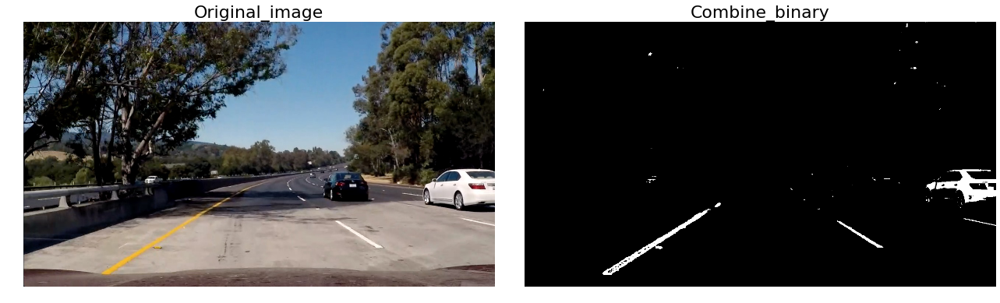

In [11]:
orig_image = mpimg.imread('./test_images/test5.jpg')
combined_binary = binary_thresh(orig_image)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18,7))
fig.tight_layout()
ax1.imshow(orig_image)
ax1.axis('off')
ax1.set_title('Original_image', fontsize=22)
ax2.imshow(combined_binary, cmap='gray')
ax2.axis('off')
ax2.set_title('Combine_binary', fontsize=22)

### 3. Describe how (and identify where in your code) you performed a perspective transform and provide an example of a transformed image.

In [12]:
def warper(image, return_Minv=False):
    img_size = (image.shape[1], image.shape[0])
    undist = undist_image(image)
    
    src = np.float32(
        [[(img_size[0] / 2) - 55, img_size[1] / 2 + 100],
        [((img_size[0] / 6) - 10), img_size[1]],
        [(img_size[0] * 5 / 6) + 60, img_size[1]],
        [(img_size[0] / 2 + 55), img_size[1] / 2 + 100]])
    dst = np.float32(
        [[(img_size[0] / 4), 0],
        [(img_size[0] / 4), img_size[1]],
        [(img_size[0] * 3 / 4), img_size[1]],
        [(img_size[0] * 3 / 4), 0]])
    
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(undist, M, img_size)
    
    image_line = np.copy(undist)
    warped_line = np.copy(warped)
    
    cv2.line(image_line, (int(src[0][0]), int(src[0][1])), (int(src[1][0]), int(src[1][1])), [255,0,0], 6, cv2.LINE_AA)
    cv2.line(image_line, (int(src[1][0]), int(src[1][1])), (int(src[2][0]), int(src[2][1])), [255,0,0], 6, cv2.LINE_AA)
    cv2.line(image_line, (int(src[2][0]), int(src[2][1])), (int(src[3][0]), int(src[3][1])), [255,0,0], 6, cv2.LINE_AA)
    cv2.line(image_line, (int(src[3][0]), int(src[3][1])), (int(src[0][0]), int(src[0][1])), [255,0,0], 6, cv2.LINE_AA)
    
    cv2.line(warped_line, (int(dst[0][0]), int(dst[0][1])), (int(dst[1][0]), int(dst[1][1])), [255,0,0], 6, cv2.LINE_AA)
    cv2.line(warped_line, (int(dst[1][0]), int(dst[1][1])), (int(dst[2][0]), int(dst[2][1])), [255,0,0], 6, cv2.LINE_AA)
    cv2.line(warped_line, (int(dst[2][0]), int(dst[2][1])), (int(dst[3][0]), int(dst[3][1])), [255,0,0], 6, cv2.LINE_AA)
    cv2.line(warped_line, (int(dst[3][0]), int(dst[3][1])), (int(dst[0][0]), int(dst[0][1])), [255,0,0], 6, cv2.LINE_AA)
    
    if return_Minv:
        return warped, Minv
    else:
        return warped, image_line, warped_line

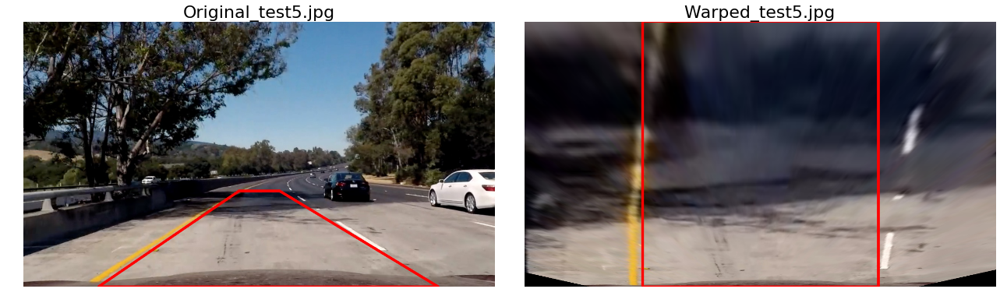

In [13]:
img_test = mpimg.imread('./test_images/test5.jpg')

_, img_line, warped_line = warper(img_test)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18,7))
fig.tight_layout()
ax1.imshow(img_line)
ax1.axis('off')
ax1.set_title('Original_test5.jpg', fontsize=22)
ax2.imshow(warped_line)
ax2.axis('off')
ax2.set_title('Warped_test5.jpg', fontsize=22)

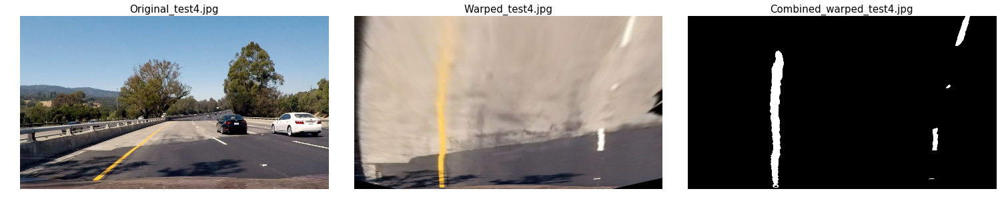

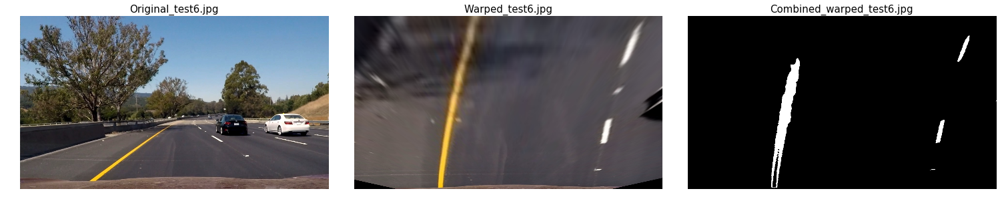

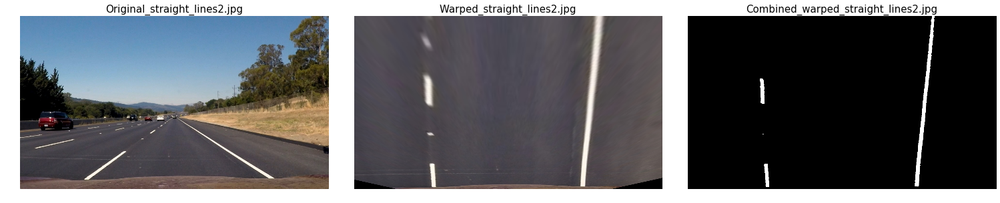

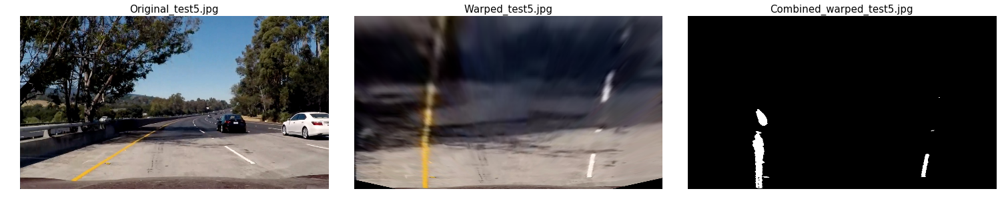

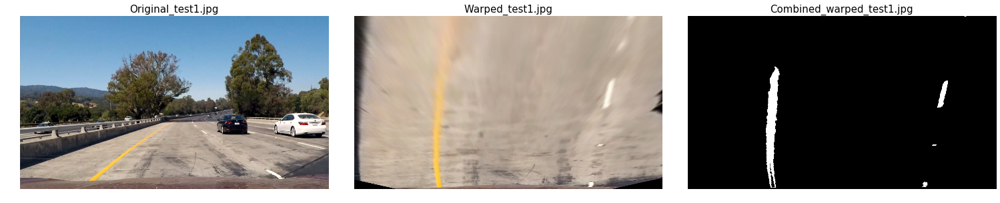

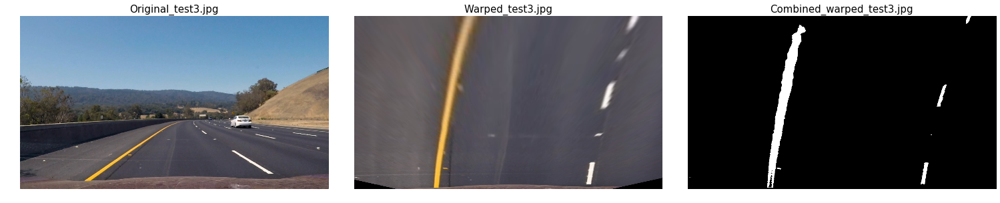

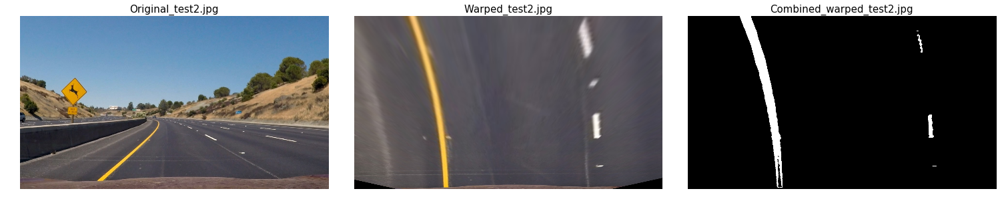

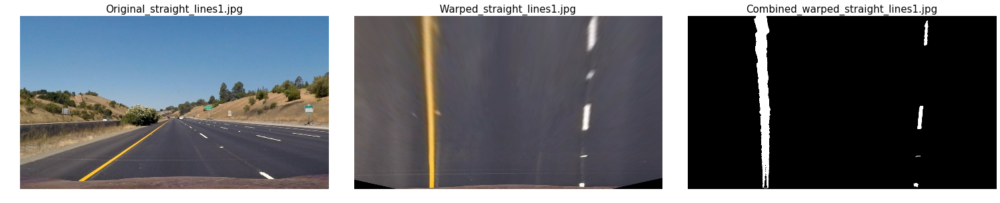

In [14]:
img_names = glob.glob('./test_images/*.jpg')
for fname in img_names:
    img_test = mpimg.imread(fname)
    warped, _, _ = warper(img_test)
    #color_warped, combined_warped = binary_thresh(warped)
    combined_warped = binary_thresh(warped)
    
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(21,7))
    fig.tight_layout()
    ax1.imshow(img_test)
    ax1.axis('off')
    ax1.set_title('Original_'+fname.split('/')[-1], fontsize=15)
    ax2.imshow(warped)
    ax2.axis('off')
    ax2.set_title('Warped_'+fname.split('/')[-1], fontsize=15)
    ax3.imshow(combined_warped, cmap='gray')
    ax3.axis('off')
    ax3.set_title('Combined_warped_'+fname.split('/')[-1], fontsize=15)


### 4. Describe how (and identify where in your code) you identified lane-line pixels and fit their positions with a polynomial?

### 5. Describe how (and identify where in your code) you calculated the radius of curvature of the lane and the position of the vehicle with respect to center.

### 6. Provide an example image of your result plotted back down onto the road such that the lane area is identified clearly.

In [18]:
def finding_lines(image):
    undist = undist_image(image)
    warped, Minv = warper(image, return_Minv=True)
    combined_warped = binary_thresh(warped)
    histogram = np.sum(combined_warped[combined_warped.shape[0]//2:,:], axis=0)
    #plt.plot(histogram)
    out_img = np.dstack((combined_warped, combined_warped, combined_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(combined_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = combined_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = combined_warped.shape[0] - (window+1)*window_height
        win_y_high = combined_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) 
                          & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) 
                           & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    ploty = np.linspace(0, combined_warped.shape[0]-1, combined_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    y_eval = np.max(ploty)
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    print('left curverad:', left_curverad, 'm', 'right_curverad:', right_curverad, 'm')
    curverad = int((left_curverad + right_curverad) / 2)
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(combined_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    
    # Find the position of the vehicle
    leftx_bound = left_fit[0]*720**2 + left_fit[1]*720 + left_fit[2]
    rightx_bound = right_fit[0]*720**2 + right_fit[1]*720 + right_fit[2]
    vehicle_pos = ((leftx_bound + rightx_bound) / 2 - 640) * xm_per_pix 
    
    #show the images
    fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(18,7))
    fig.tight_layout()
    ax1.imshow(out_img)
    ax1.plot(left_fitx, ploty, color='yellow', linewidth=2)
    ax1.plot(right_fitx, ploty, color='yellow', linewidth=2)
    ax1.set_xlim(0, 1280)
    ax1.set_ylim(720, 0)
    ax1.set_title('Finding_Polynomials', fontsize=20)
    ax2.imshow(warped)
    ax2.plot(left_fitx, ploty, color='blue', linewidth=2)
    ax2.plot(right_fitx, ploty, color='blue', linewidth=2)
    ax2.set_xlim(0, 1280)
    ax2.set_ylim(720, 0)
    ax2.set_title('Add_Polynomials_on_Lanelines', fontsize=20)
    ax3.imshow(result)
    ax3.set_title('Fill_Lanelines', fontsize=20)
    ax3.text(100, 100, 'Radius of Curvature = {}(m)'.format(curverad), color='white', style='italic', fontsize=20)
    if vehicle_pos > 0:
        ax3.text(100, 160, 'Vehicle is {:.2f}(m) left of center'.format(abs(vehicle_pos)), color='white', style='italic', fontsize=20)
    else:
        ax3.text(100, 160, 'Vehicle is {:.2f}(m) right of center'.format(abs(vehicle_pos)), color='white', style='italic', fontsize=20)


left curverad: 1450.14368893 m right_curverad: 898.651820345 m


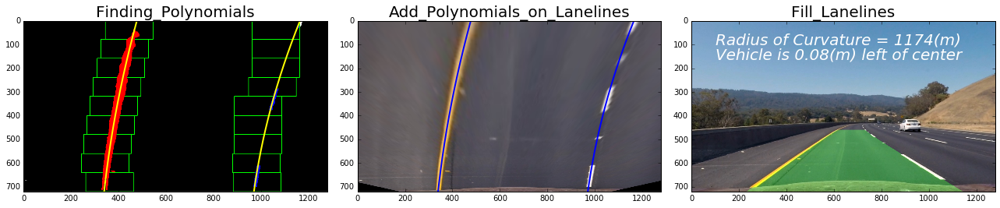

In [19]:
img_test = mpimg.imread('./test_images/test3.jpg')
finding_lines(img_test)

left curverad: 1386.34273378 m right_curverad: 795.823782468 m
left curverad: 1173.18722939 m right_curverad: 774.915113958 m
left curverad: 3178.31332531 m right_curverad: 169300.038398 m
left curverad: 526.134702243 m right_curverad: 2163.72734979 m
left curverad: 738.085962119 m right_curverad: 1282.66734763 m
left curverad: 1450.14368893 m right_curverad: 898.651820345 m
left curverad: 645.035500995 m right_curverad: 1749.35930551 m
left curverad: 9933.20376814 m right_curverad: 26499.5381584 m


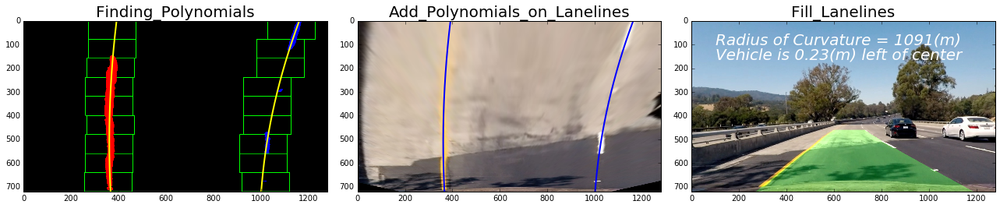

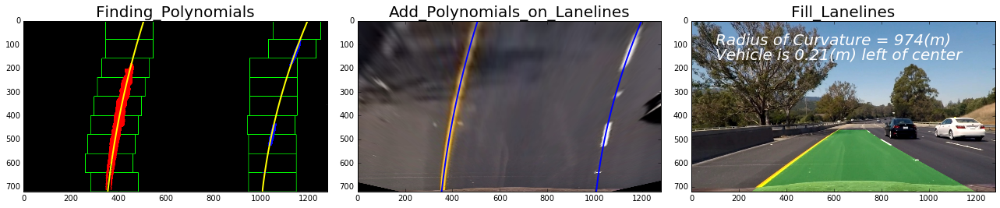

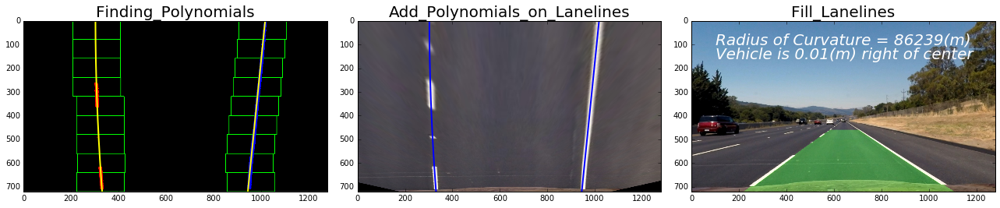

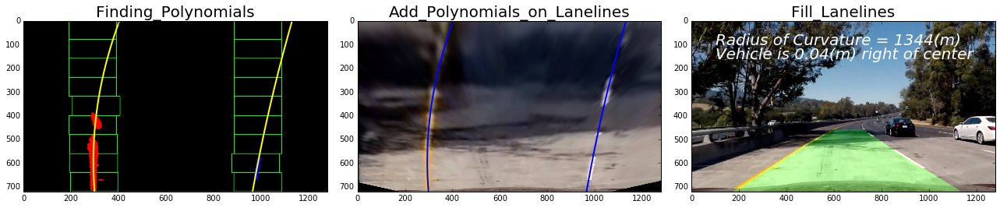

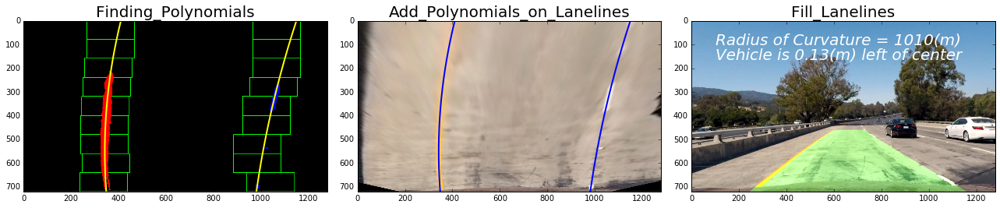

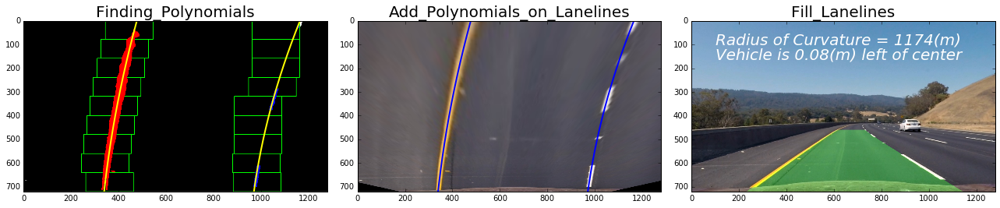

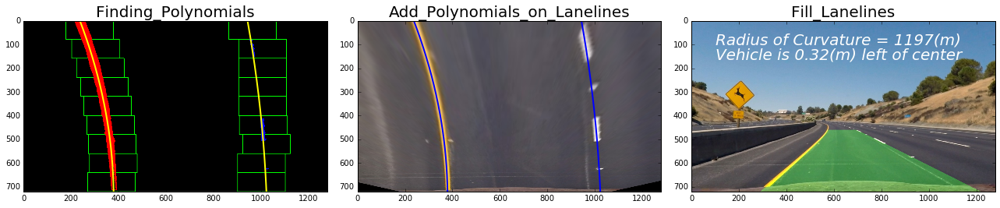

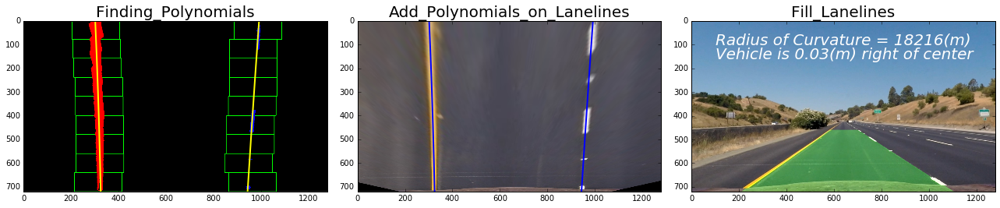

In [20]:
img_names = glob.glob('./test_images/*.jpg')
for fname in img_names:
    img_test = mpimg.imread(fname)
    finding_lines(img_test)

# Pipeline (video)
---
### 1. Provide a link to your final video output.  Your pipeline should perform reasonably well on the entire project video (wobbly lines are ok but no catastrophic failures that would cause the car to drive off the road!).

In [21]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self, n_iter=5):
        # was the line detected in the last iteration?
        self.detected = False
        # define number of iterations for average the x and fit
        self.n_iter = n_iter
        # define counter of fail for restart search lines
        self.n_fail = 0        
        
        # x values of the most recent fit of the line
        self.current_xfitted = None
        # x values of the last n fits of the line
        self.recent_xfitted = []
        #average x values of the fitted line over the last n iterations
        self.bestx = None
        
        #polynomial coefficients for the most recent fit
        self.current_fit = None 
        # fit values of the last n fits of the line
        self.recent_fits = []
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        
        #radius of curvature of the line in some units
        self.radius_of_curvature = None
        self.radius = None #save every 5th data
        #distance in meters of vehicle center from the line
        self.line_base_pos = None
        self.line_pos = None #save every 5th data
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
        #y values for polyfit
        self.ploty = np.linspace(0, 719, 720)
              
        #Frame counter
        self.counter = 0            
        
    # First find the lines, using the sliding windows
    def windows_sliding(self, binary_warped, nonzerox, nonzeroy):        
        histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
        # Find the peak of the left or right halves of the histogram
        # These will be the starting point for the left or right lines
        midpoint = np.int(histogram.shape[0]/2)
        if self == left_line:
            x_base = np.argmax(histogram[:midpoint])
        else:
            x_base = np.argmax(histogram[midpoint:]) + midpoint

        # Choose the number of sliding windows
        nwindows = 9
        # Set height of windows
        window_height = np.int(binary_warped.shape[0]/nwindows)        
        # Current positions to be updated for each window
        x_current = x_base
        # Set the width of the windows +/- margin
        margin = 100
        # Set minimum number of pixels found to recenter window
        minpix = 50
        # Create empty lists to receive left and right lane pixel indices
        lane_inds = []

        # Step through the windows one by one
        for window in range(nwindows):
            # Identify window boundaries in x and y 
            win_y_low = binary_warped.shape[0] - (window+1)*window_height
            win_y_high = binary_warped.shape[0] - window*window_height
            win_x_low = x_current - margin
            win_x_high = x_current + margin

            # Identify the nonzero pixels in x and y within the window
            good_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) 
                              & (nonzerox >= win_x_low) & (nonzerox < win_x_high)).nonzero()[0]
            # Append these indices to the lists
            lane_inds.append(good_inds)
            # If you found > minpix pixels, recenter next window on their mean position
            if len(good_inds) > minpix:
                x_current = np.int(np.mean(nonzerox[good_inds]))

        # Concatenate the arrays of indices
        lane_inds = np.concatenate(lane_inds)

        # Extract left and right line pixel positions
        xvals = nonzerox[lane_inds]
        yvals = nonzeroy[lane_inds]
        sorted_inds = np.argsort(yvals)
        xvals = xvals[sorted_inds]
        yvals = yvals[sorted_inds]
        if len(xvals) > 0:
            self.allx = xvals
            self.ally = yvals
            self.detected = True
            self.n_fail = 0
            self.calc_fit()
            self.calc_curvature(self.current_xfitted)
            self.calc_basepoint(self.current_fit)
        else:
            self.allx = None
            self.ally = None
            self.detected = False
            self.n_fail += 1
            if len(self.recent_fits) > 1:
                self.recent_xfitted.pop(0)
                self.recent_fits.pop(0)
            self.bestx = np.mean(np.array(self.recent_xfitted), axis=0)
            self.best_fit = np.mean(np.array(self.recent_fits), axis=0)
            self.calc_curvature(self.bestx)
            self.calc_basepoint(self.best_fit)

    # When we know the where the lines are, skip the sliding windows
    def search_lines(self, nonzerox, nonzeroy):        
        margin = 100
        lane_inds = ((nonzerox > (self.best_fit[0]*(nonzeroy**2) + self.best_fit[1]*nonzeroy + self.best_fit[2] - margin)) 
                          & (nonzerox < (self.best_fit[0]*(nonzeroy**2) + self.best_fit[1]*nonzeroy + self.best_fit[2] + margin))) 

        # Again, extract left and right line pixel positions
        xvals = nonzerox[lane_inds]
        yvals = nonzeroy[lane_inds]
        sorted_inds = np.argsort(yvals)
        xvals = xvals[sorted_inds]
        yvals = yvals[sorted_inds]
        if len(xvals) > 0:
            self.allx = xvals
            self.ally = yvals
            self.detected = True
            self.n_fail = 0
            self.calc_fit()
            self.calc_curvature(self.current_xfitted)
            self.calc_basepoint(self.current_fit)
        else:
            self.allx = None
            self.ally = None
            self.detected = False
            self.n_fail += 1
            if len(self.recent_fits) > 1:
                self.recent_xfitted.pop(0)
                self.recent_fits.pop(0)
            self.bestx = np.mean(np.array(self.recent_xfitted), axis=0)
            self.best_fit = np.mean(np.array(self.recent_fits), axis=0)
            self.calc_curvature(self.bestx)
            self.calc_basepoint(self.best_fit)
        
    def calc_fit(self, poly_order=2):
        fit = np.polyfit(self.ally, self.allx, poly_order)
        self.current_fit = fit
        
        x_fitted = self.current_fit[0]*self.ploty**2 + self.current_fit[1]*self.ploty + self.current_fit[2]
        self.current_xfitted = x_fitted
        self.recent_xfitted.append(self.current_xfitted)
        self.recent_fits.append(self.current_fit)
        if len(self.recent_fits) > self.n_iter: 
            self.recent_xfitted.pop(0)
            self.recent_fits.pop(0)
        self.bestx = np.mean(np.array(self.recent_xfitted), axis=0)
        self.best_fit = np.mean(np.array(self.recent_fits), axis=0)
        
    # Calculate the curvature
    def calc_curvature(self, fitx):
        ym_per_pix = 30/720 # meters per pixel in y dimension
        xm_per_pix = 3.7/700 # meters per pixel in x dimension
        
        y_eval = np.max(self.ploty)
        # Fit new polynomials to x,y in world space
        fit_cr = np.polyfit(self.ploty*ym_per_pix, fitx*xm_per_pix, 2)
        # Calculate the new radii of curvature
        curverad = ((1 + (2*fit_cr[0]*y_eval*ym_per_pix + fit_cr[1])**2)**1.5) / np.absolute(2*fit_cr[0])
        
        self.radius_of_curvature = curverad
    # Calculate the vehicle position   
    def calc_basepoint(self, fit):
        y_eval = np.max(self.ploty)
        line_base_pos = fit[0]*y_eval**2 + fit[1]*y_eval + fit[2]
        self.line_base_pos = line_base_pos

In [22]:
def Pipeline(image):
    img_size = (image.shape[1], image.shape[0])
    # Calibrate camera and undistort image
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    undist = cv2.undistort(image, mtx, dist, None, mtx)
    # Perspective transform
    src = np.float32(
        [[(img_size[0] / 2) - 55, img_size[1] / 2 + 100],
        [((img_size[0] / 6) - 10), img_size[1]],
        [(img_size[0] * 5 / 6) + 60, img_size[1]],
        [(img_size[0] / 2 + 55), img_size[1] / 2 + 100]])
    dst = np.float32(
        [[(img_size[0] / 4), 0],
        [(img_size[0] / 4), img_size[1]],
        [(img_size[0] * 3 / 4), img_size[1]],
        [(img_size[0] * 3 / 4), 0]])
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(undist, M, img_size)
    # Binary threshold image
    lab = cv2.cvtColor(warped, cv2.COLOR_RGB2Lab)
    l_channel = lab[:,:,0]
    b_channel = lab[:,:,2]
    # Pickup the yellow lines
    b_binary = np.zeros_like(b_channel)
    b_binary[(b_channel >= 150) & (b_channel <= 200)] = 1
    # Pickup the white lines
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= 217) & (l_channel <= 255)] = 1
    
    binary_warped = np.zeros_like(l_binary)
    binary_warped[(b_binary == 1) | (l_binary == 1)] = 1
    
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    if left_line.detected == False or left_line.n_fail > 2 or left_line.counter < 5 :
        left_line.windows_sliding(binary_warped, nonzerox, nonzeroy)
    else:
        left_line.search_lines(nonzerox, nonzeroy)
        
    if right_line.detected == False or right_line.n_fail > 2 or right_line.counter < 5 :
        right_line.windows_sliding(binary_warped, nonzerox, nonzeroy)    
    else:
        right_line.search_lines(nonzerox, nonzeroy)
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_line.bestx, left_line.ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_line.bestx, right_line.ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, img_size) 
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    
    # Refresh the radius of curvature and the position of vehicle every 5 frames for improved readability
    if left_line.counter % 5 == 0:
        left_line.radius = left_line.radius_of_curvature
        right_line.radius = right_line.radius_of_curvature
        left_line.line_pos = left_line.line_base_pos
        right_line.line_pos = right_line.line_base_pos
        
    # Calculate the curve radius
    curverad = int((left_line.radius + right_line.radius) / 2)
    # Find the position of the vehicle
    vehicle_pos = ((left_line.line_pos + right_line.line_pos) / 2 - 640) * xm_per_pix 
    
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(result, 'Radius of Curvature = {}(m)'.format(curverad), (100, 100), font, fontScale = 2, color=(255,255,255), thickness = 3)
    if vehicle_pos > 0:
        cv2.putText(result, 'Vehicle is {:.2f}(m) left of center'.format(abs(vehicle_pos)), (100, 160), font, fontScale = 2, color=(255,255,255), thickness = 3)
    else:
        cv2.putText(result, 'Vehicle is {:.2f}(m) right of center'.format(abs(vehicle_pos)), (100, 160), font, fontScale = 2, color=(255,255,255), thickness = 3)
    
    left_line.counter += 1
    right_line.counter += 1
    
    return result

True

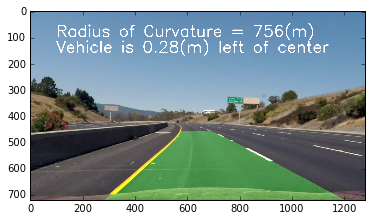

In [23]:
left_line = Line()
right_line = Line()
img_test = mpimg.imread('./test_images3/1.jpg')
result = Pipeline(img_test)
plt.imshow(result)
#plt.savefig('./output_images2/120.jpg')
cv2.imwrite('./output_images3/1.jpg', result)

In [24]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML
left_line = Line()
right_line = Line()
video_output = 'output_project_video.mp4'
clip = VideoFileClip("project_video.mp4")
clip = clip.fl_image(Pipeline) 
clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video output_project_video.mp4
[MoviePy] Writing video output_project_video.mp4


100%|█████████▉| 1260/1261 [29:50<00:01,  1.41s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_project_video.mp4 



In [ ]:
left_line = Line()
right_line = Line()
video_output = 'output_challenge_video.mp4'
clip = VideoFileClip("challenge_video.mp4")
clip = clip.fl_image(Pipeline) 
clip.write_videofile(video_output, audio=False)